### Libraries import 

*Resources to check: https://www.sicara.ai/blog/2019-03-12-edge-detection-in-opencv*

In [1]:
import numpy as np
import cv2 
import matplotlib.pyplot as plt 

%matplotlib inline

Canny detector is very simple and can be performed using open-CV library. 

Start as usually with image visualization.

Text(0.5, 1.0, 'Original image')

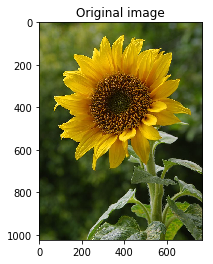

In [5]:
image = cv2.imread('example images/sunflower.jpg')
image_copy = np.copy(image)

image_copy = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.imshow(image_copy)
plt.title('Original image')

Convert image to grayscale. 

Text(0.5, 1.0, 'Grayscale image')

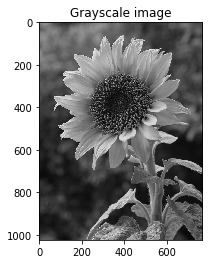

In [9]:
gray = cv2.cvtColor(image_copy, cv2.COLOR_RGB2GRAY)
plt.imshow(gray, cmap='gray')
plt.title('Grayscale image')

### Implement Canny edge detector

To perform **hysteresis** we need to set up **lower and upper boundaries**. <br>
Edges, that we want to detoect vary in intensity from 0 to 255.<br>
**Rule of thumb**: it's recommended to use thresholds **ratio 1:2 or 1:3** for best result. <br>
Use cv2.Canny().

Text(0.5, 1.0, 'Canny edge applied')

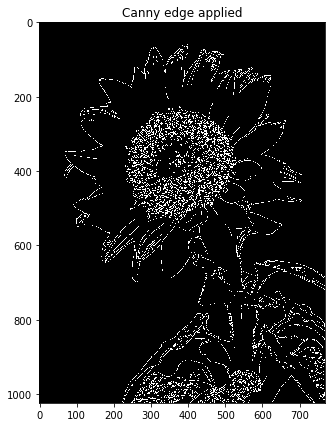

In [12]:
# lets put lower and higher boundaries at 120 and 240 

lower = 120
upper = 240 

edges = cv2.Canny(gray, lower, upper)

fig = plt.figure(figsize = (15,7))
plt.imshow(edges, cmap ='gray')
plt.title('Canny edge applied')

We can **blurry image a little bit**, but in general, Canny algorithm performed quite well, detecting main edges. 

Let's add **Gaussian blur** to an image to reduce noise and improve the result.

Text(0.5, 1.0, 'Blurred image')

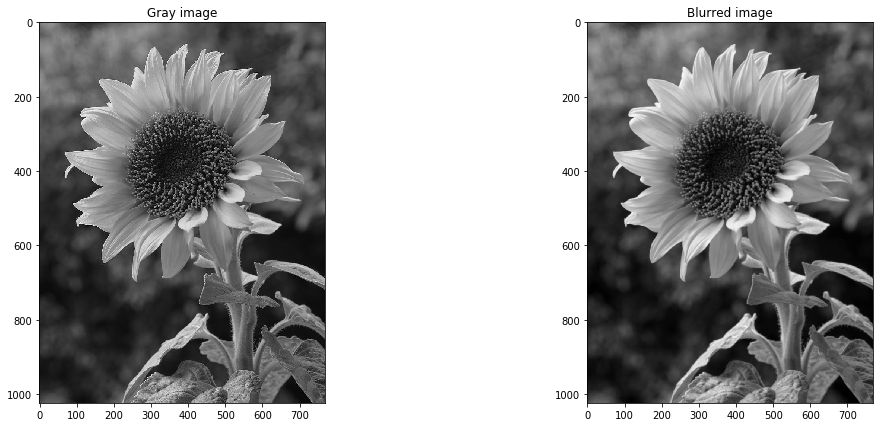

In [16]:
gray_blurred = cv2.GaussianBlur(gray, (5,5), 0)

f, (ax1, ax2) = plt.subplots(1,2, figsize = (18,7))

ax1.imshow(gray, cmap = 'gray')
ax1.set_title('Gray image')
ax2.imshow(gray_blurred, cmap = 'gray')
ax2.set_title('Blurred image')

We see, how Gaussian blur makes image bit smoother, **removing meaningless high frequencies**. <br>
Canny detrector produces **binary image as an output**. <br>
Then, apply Canny detector on blurred image. 

Text(0.5, 1.0, 'Canny: applied blur')

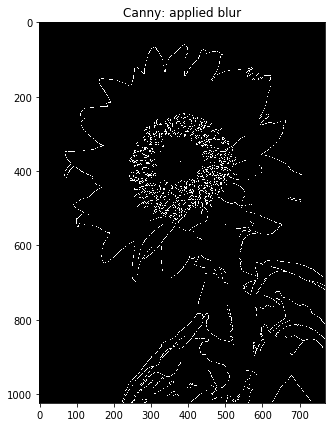

In [19]:
# let's use same thresholds 
blurred_canny = cv2.Canny(gray_blurred, lower, upper)
# visualize result 
f = plt.figure(figsize = (16,7))
plt.imshow(blurred_canny, cmap = 'gray')
plt.title('Canny: applied blur')

Now we see how accurate the edges were detected. Noise was removed from the output. 

### Improving performance

Is it possible to improve our performance and make Canny detector even better?<br>
Answer: Yes! We can play around with **thresholds**.<br>
Let's create two more detectors with different thresholds. <br>
First will have wide range of acceptable edges (just few will be filtered out), while second one - will narrow this.

Text(0.5, 1.0, 'Canny with narrow thresholds')

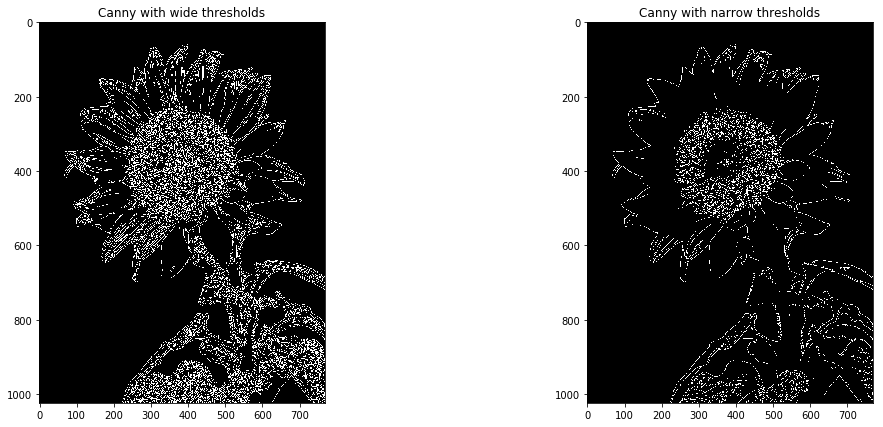

In [20]:
canny_wide = cv2.Canny(gray, 30, 100)
canny_tight = cv2.Canny(gray, 180, 240)


f, (ax1, ax2) = plt.subplots(1,2, figsize = (18,7))

ax1.imshow(canny_wide, cmap = 'gray')
ax1.set_title('Canny with wide thresholds')
ax2.imshow(canny_tight, cmap = 'gray')
ax2.set_title('Canny with narrow thresholds')

We see that "tight Canny detector" **isolates only core edges** in contrast to wide one. 

### Optional example

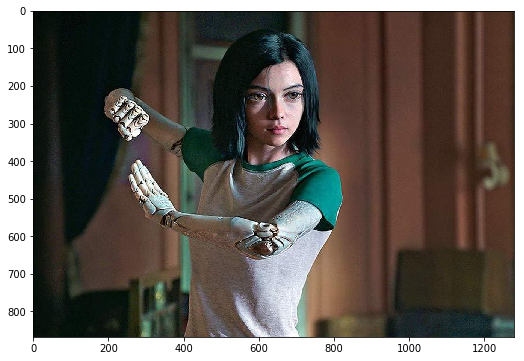

In [72]:
img = cv2.imread('example images/alita.jpg')
img_copy = np.copy(img)
img_copy = cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB)

f = plt.figure(figsize=(18,6))
plt.imshow(img_copy)

On the image above we see a lot of high frequencies, that creates noise that negatively effect edge detecting. <br>
Next, apply Gaussian blur and visualize both images. 

([], <a list of 0 Text yticklabel objects>)

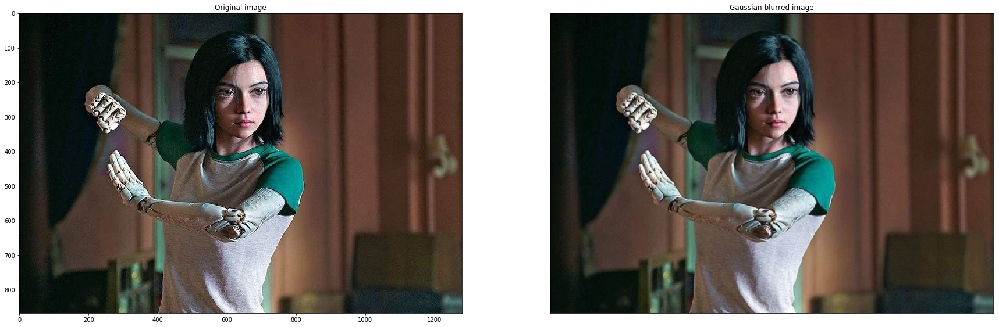

In [3]:
img_blur = cv2.GaussianBlur(img_copy, (5,5), 0)

f, (ax1, ax2) = plt.subplots(1,2, figsize = (30,15))

ax1.imshow(img_copy)
ax1.set_title('Original image')
plt.xticks([])
plt.yticks([])

ax2.imshow(img_blur)
ax2.set_title('Gaussian blurred image')
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

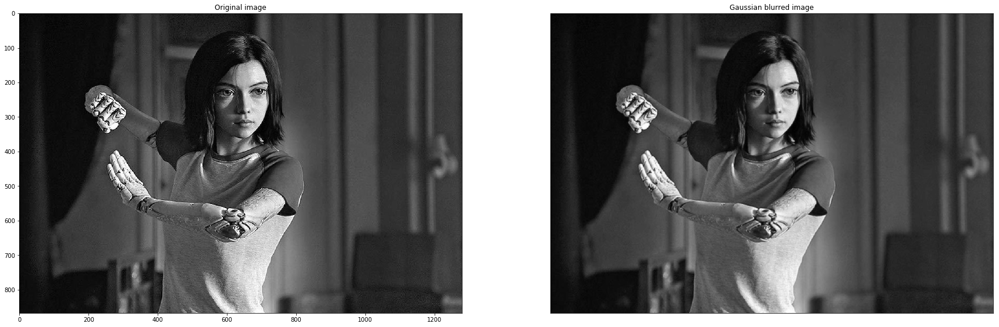

In [4]:
gray = cv2.cvtColor(img_copy, cv2.COLOR_RGB2GRAY)
gray_blur = cv2.GaussianBlur(gray, (5,5), 0)

f, (ax1, ax2) = plt.subplots(1,2, figsize = (30,15))

ax1.imshow(gray, cmap = 'gray')
ax1.set_title('Original image')
plt.xticks([])
plt.yticks([])

ax2.imshow(gray_blur, cmap = 'gray')
ax2.set_title('Gaussian blurred image')
plt.xticks([])
plt.yticks([])

Apply **Canny edge detector** on both original and blurred images and compare the results.

([], <a list of 0 Text yticklabel objects>)

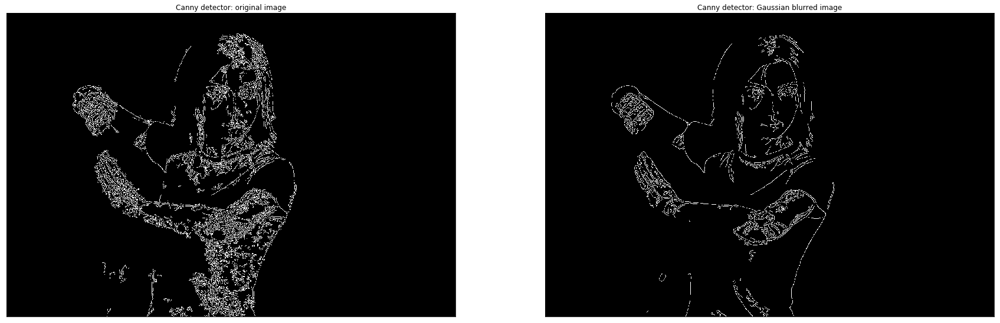

In [5]:
# create two Canny detectors with same thresholds and apply on 2 images  
orig_canny = cv2.Canny(gray, 60, 180)
blurred_canny = cv2.Canny(gray_blur, 60, 180)
# visualize result 

f = plt.figure(figsize=(30,15))

plt.subplot(121)
plt.imshow(orig_canny, cmap='gray')
plt.title('Canny detector: original image')
plt.xticks([])
plt.yticks([])

plt.subplot(122)
plt.imshow(blurred_canny, cmap='gray')
plt.title('Canny detector: Gaussian blurred image')
plt.xticks([])
plt.yticks([])

### Example with Laplacian filter

Let's apply **Laplacian filter** before Canny detector and visualize performance. 

([], <a list of 0 Text yticklabel objects>)

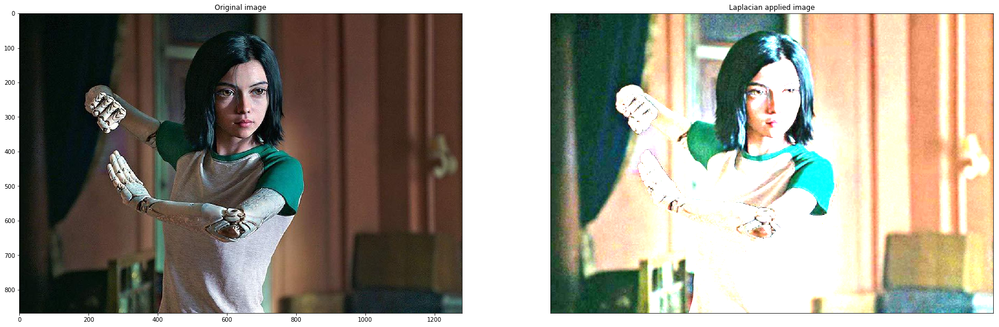

In [6]:
laplacian = np.array([
    [1, 1, 1],
    [1, -4, 1],
    [1, 1, 1]])

laplacian_img = cv2.filter2D(img_copy, -1, laplacian)

f, (ax1, ax2) = plt.subplots(1,2, figsize = (30,15))

ax1.imshow(img_copy, cmap = 'gray')
ax1.set_title('Original image')
plt.xticks([])
plt.yticks([])

ax2.imshow(laplacian_img, cmap = 'gray')
ax2.set_title('Laplacian applied image')
plt.xticks([])
plt.yticks([])

Tansform original image into **gray**, then apply Laplacian filter. <br>

In [7]:
gray = cv2.cvtColor(img_copy, cv2.COLOR_RGB2GRAY)
gray_laplacian = cv2.filter2D(gray, -1, laplacian)

([], <a list of 0 Text yticklabel objects>)

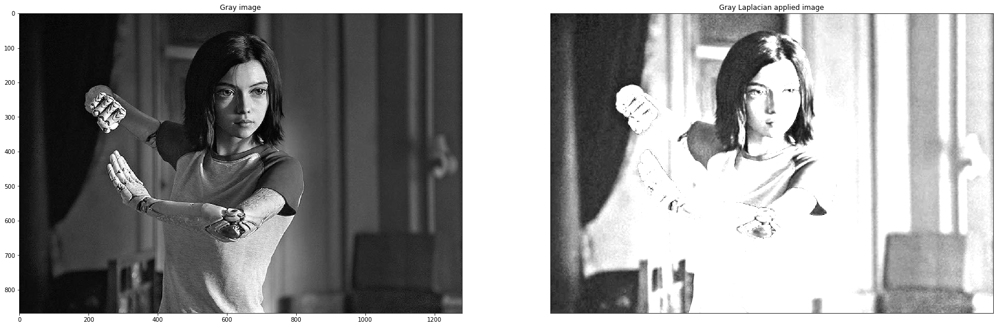

In [8]:
f, (ax1, ax2) = plt.subplots(1,2, figsize = (30,15))

ax1.imshow(gray, cmap = 'gray')
ax1.set_title('Gray image')
plt.xticks([])
plt.yticks([])

ax2.imshow(gray_laplacian, cmap = 'gray')
ax2.set_title('Gray Laplacian applied image')
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

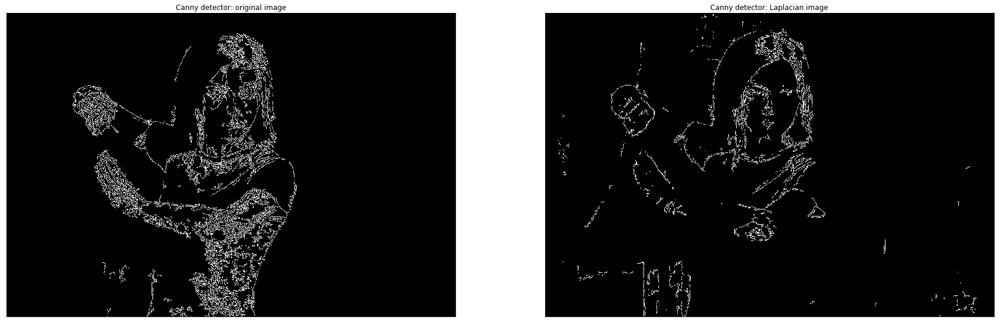

In [9]:
# create two Canny detectors with same thresholds and apply on 2 images  
orig_canny = cv2.Canny(gray, 60, 180)
laplacian_canny = cv2.Canny(gray_laplacian, 120, 240)
# visualize result 

f = plt.figure(figsize=(30,15))

plt.subplot(121)
plt.imshow(orig_canny, cmap='gray')
plt.title('Canny detector: original image')
plt.xticks([])
plt.yticks([])

plt.subplot(122)
plt.imshow(laplacian_canny, cmap='gray')
plt.title('Canny detector: Laplacian image')
plt.xticks([])
plt.yticks([])

However, performance of **Laplacian filter** followed by Canny detector seems low for edge detection problem. 

**Summary**:

- **Laplacian filter** can be a good fit for applied effects and visual representation of image;
- While **Gaussian blur**, applied beforehand can be useful with Canny edge detector.

([], <a list of 0 Text yticklabel objects>)

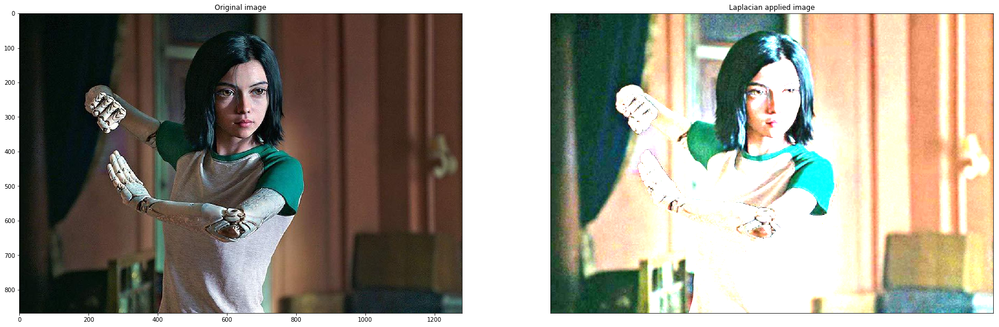

In [83]:
laplacian = np.array([
    [1, -1, 1],
    [1, -1, 1],
    [1, -1, 1]])

blurred_orig = cv2.GaussianBlur(img_copy, (5,5), 0)
laplacian_blur_img = cv2.filter2D(blurred_orig, -1, laplacian)

f, (ax1, ax2) = plt.subplots(1,2, figsize = (30,15))

ax1.imshow(img_copy, cmap = 'gray')
ax1.set_title('Original image')
plt.xticks([])
plt.yticks([])

ax2.imshow(laplacian_img, cmap = 'gray')
ax2.set_title('Laplacian applied image')
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

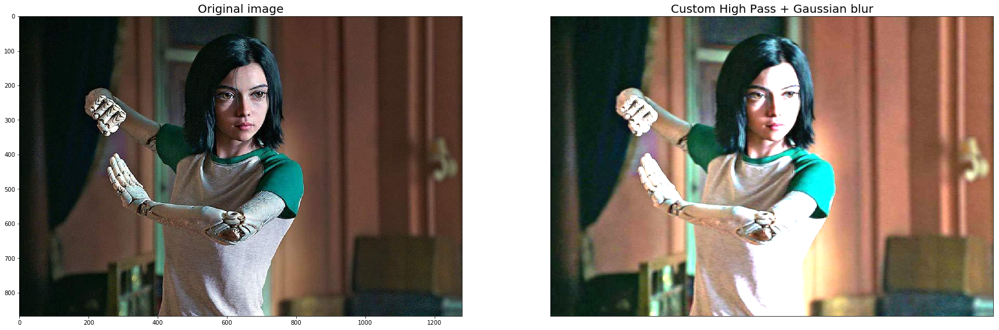

In [87]:
img = cv2.imread('example images/alita.jpg')
img_copy = np.copy(img)
img_copy = cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB)

custom_filter = np.array([
    [1, -1, 1],
    [1, -2, 1],
    [1, -1, 1]])

gaussian_blur = cv2.GaussianBlur(img_copy, (3,3), 0)

filtered_img = cv2.filter2D(gaussian_blur, -1, custom_filter)
f, (ax1, ax2) = plt.subplots(1,2, figsize = (30,15))

ax1.imshow(img_copy, cmap = 'gray')
ax1.set_title('Original image', fontsize=20)
plt.xticks([])
plt.yticks([])

ax2.imshow(filtered_img, cmap = 'gray')
ax2.set_title('Custom High Pass + Gaussian blur', fontsize=20)
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text yticklabel objects>)

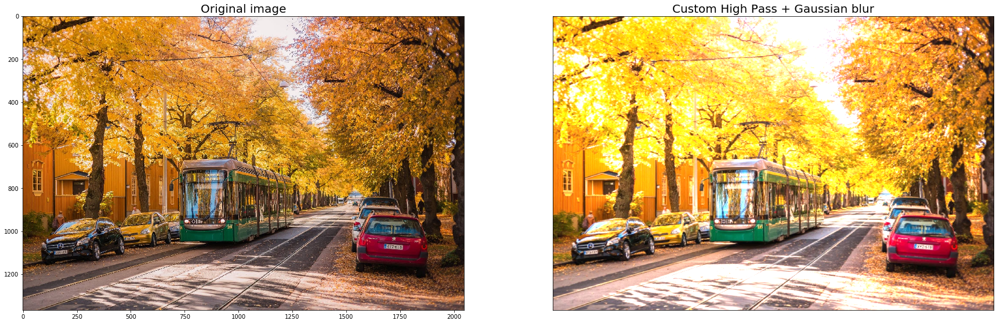

In [57]:
img = cv2.imread('example images/hels.jpg')
img_copy = np.copy(img)
img_copy = cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB)

custom_filter =  0.8 * np.array([
    [1, -1, 1],
    [1, -2, 1],
    [1, -1, 1]])

gaussian_blur = cv2.GaussianBlur(img_copy, (3,3), 0)

filtered_img = cv2.filter2D(gaussian_blur, -1, custom_filter)
f, (ax1, ax2) = plt.subplots(1,2, figsize = (30,15))

ax1.imshow(img_copy, cmap = 'gray')
ax1.set_title('Original image', fontsize=20)
plt.xticks([])
plt.yticks([])

ax2.imshow(filtered_img, cmap = 'gray')
ax2.set_title('Custom High Pass + Gaussian blur', fontsize=20)
plt.xticks([])
plt.yticks([])